# 🥦 채소 이미지 분류 - Pretrained 모델 비교 실험

# 환경

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install -q kaggle
!pip install --upgrade kaggle

from google.colab import files
files.upload() #add kaggle.json

!ls -lha kaggle.json
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
-rw-r--r-- 1 root root 64 Mar 29 08:56 kaggle.json


In [ ]:
# 예시 명령어 (본인이 선택한 데이터셋의 명령어로 변경!)
!kaggle datasets download -d misrakahmed/vegetable-image-dataset

# 압축 해제 (zip 파일 기준)
!unzip vegetable-image-dataset.zip -d vegetable_images

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  inflating: vegetable_images/Vegetable Images/train/Radish/0001.jpg  
  inflating: vegetable_images/Vegetable Images/train/Radish/0002.jpg  
  inflating: vegetable_images/Vegetable Images/train/Radish/0003.jpg  
  inflating: vegetable_images/Vegetable Images/train/Radish/0004.jpg  
  inflating: vegetable_images/Vegetable Images/train/Radish/0005.jpg  
  inflating: vegetable_images/Vegetable Images/train/Radish/0006.jpg  
  inflating: vegetable_images/Vegetable Images/train/Radish/0007.jpg  
  inflating: vegetable_images/Vegetable Images/train/Radish/0008.jpg  
  inflating: vegetable_images/Vegetable Images/train/Radish/0009.jpg  
  inflating: vegetable_images/Vegetable Images/train/Radish/0010.jpg  
  inflating: vegetable_images/Vegetable Images/train/Radish/0011.jpg  
  inflating: vegetable_images/Vegetable Images/train/Radish/0012.jpg  
  inflating: vegetable_images/Vegetable Images/train/Radish/0013.jpg  
  inflating: vegetable_images/Vegetable I

In [ ]:
import os

# 압축 해제된 폴더 경로 확인
os.listdir('/content/vegetable_images/Vegetable Images')

['test', 'train', 'validation']

In [ ]:
# 🥦 채소 이미지 분류 - Pretrained 모델 비교 실험 (TensorBoard 포함)

## 1. 라이브러리 로딩
import os, time, random
import sqlite3
from datetime import datetime
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
from torchvision import models
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from PIL import Image
from tqdm import tqdm

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("✅ Device:", device)

✅ Device: cuda


# 2. 데이터셋 및 EDA

클래스 수: 15
전체 이미지 수: 15000

클래스별 이미지 수:


,Count
Bean,1000
Bitter_Gourd,1000
Bottle_Gourd,1000
Brinjal,1000
Broccoli,1000
Cabbage,1000
Capsicum,1000
Carrot,1000
Cauliflower,1000
Cucumber,1000


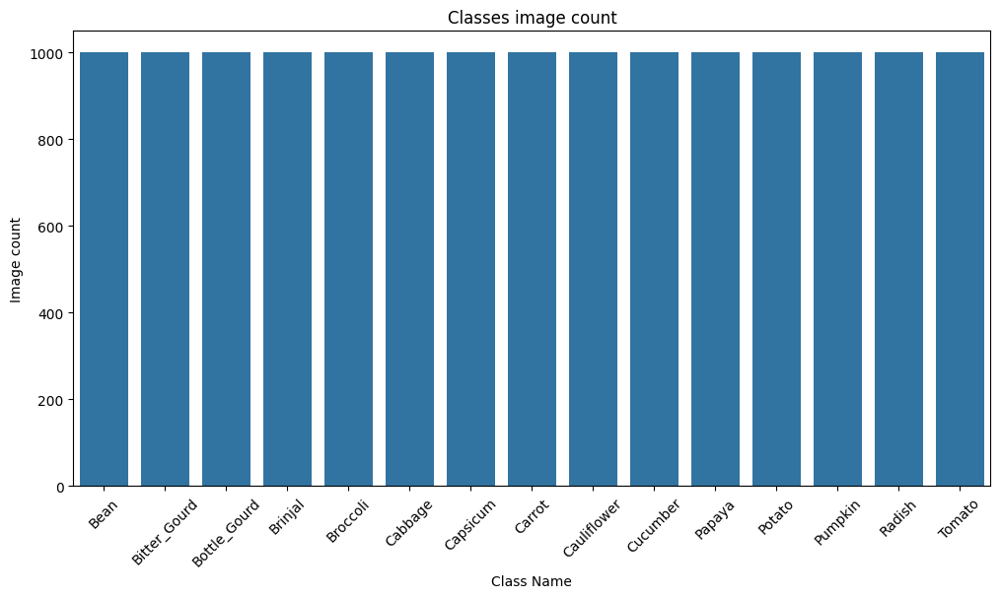

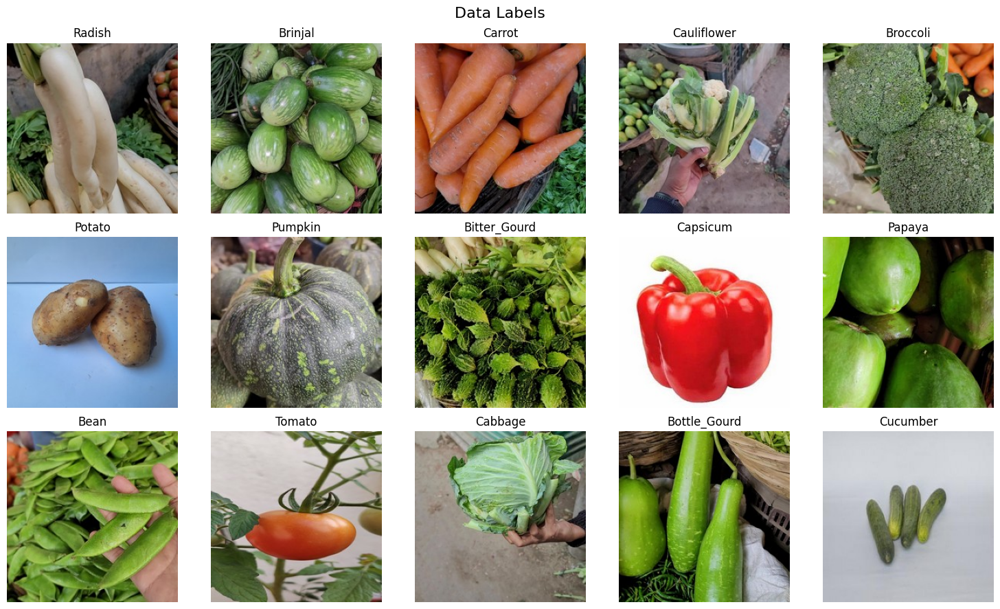

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from PIL import Image

# 📁 데이터셋 경로 설정
data_dir = '/content/vegetable_images/Vegetable Images'
train_path = os.path.join(data_dir, 'train')

# 📊 클래스별 이미지 수 집계
classes = sorted(os.listdir(train_path))
class_counts = {cls: len(os.listdir(os.path.join(train_path, cls))) for cls in classes}
df_counts = pd.DataFrame.from_dict(class_counts, orient='index', columns=['Count']).sort_values('Count', ascending=False)

# 🔍 데이터 요약 출력
total_images = sum(df_counts['Count'])
num_classes = len(classes)
print(f"클래스 수: {num_classes}")zc
print(f"전체 이미지 수: {total_images}")
print("\n클래스별 이미지 수:")
display(df_counts)

# 📊 클래스별 이미지 수 시각화
plt.figure(figsize=(12,6))
sns.barplot(x=df_counts.index, y='Count', data=df_counts)
plt.xticks(rotation=45)
plt.title('Classes image count')
plt.ylabel('Image count')
plt.xlabel('Class Name')
plt.show()

def show_random_images_unique(base_dir, n_samples=15, grid_cols=5):
    # 각 클래스에서 한 장씩 샘플링하여 최소한의 다양성을 확보
    unique_samples = []
    classes = sorted(os.listdir(base_dir))
    for cls in classes:
        cls_path = os.path.join(base_dir, cls)
        images = os.listdir(cls_path)
        if images:  # 해당 클래스에 이미지가 있다면
            img = random.choice(images)
            unique_samples.append((cls, os.path.join(cls_path, img)))

    # n_samples보다 고유 샘플 수가 부족하다면, 추가 이미지를 전체 데이터셋에서 무작위로 샘플링
    if len(unique_samples) < n_samples:
        all_images = []
        for cls in classes:
            cls_path = os.path.join(base_dir, cls)
            images = os.listdir(cls_path)
            for img in images:
                img_path = os.path.join(cls_path, img)
                all_images.append((cls, img_path))
        # 이미 고른 이미지를 제외하고 추가 샘플 선택
        remaining = [item for item in all_images if item not in unique_samples]
        additional = random.sample(remaining, min(n_samples - len(unique_samples), len(remaining)))
        samples = unique_samples + additional
    else:
        # 고유 샘플이 n_samples보다 많으면 무작위로 n_samples 선택
        samples = random.sample(unique_samples, n_samples)

    grid_rows = (len(samples) + grid_cols - 1) // grid_cols
    plt.figure(figsize=(grid_cols * 3, grid_rows * 3))
    for i, (cls, img_path) in enumerate(samples):
        plt.subplot(grid_rows, grid_cols, i + 1)
        image = Image.open(img_path)
        plt.imshow(image)
        plt.title(cls)
        plt.axis('off')

    plt.suptitle("Data Labels", fontsize=16)
    plt.tight_layout()
    plt.show()

# 랜덤으로 이미지 15개 시각화 (그리드 열 수 5)
show_random_images_unique(train_path, n_samples=15, grid_cols=5)


# 전처리 및 DataLoader
### image size = 224
### Batch size = 32
### 모델
1. Resnet18
2. MobileNetV2
3. EfficientNetB0
4. GoogleNet
5. Deep CNN

In [ ]:
## 3. 전처리 및 DataLoader
IMG_SIZE = 224
BATCH_SIZE = 32

transform_train = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

transform_val = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

transform_test = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

train_dataset = ImageFolder(os.path.join(data_dir, 'train'), transform=transform_train)
val_dataset = ImageFolder(os.path.join(data_dir, 'validation'), transform=transform_val)
test_dataset = ImageFolder(os.path.join(data_dir, 'test'), transform=transform_test)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

class_names = train_dataset.classes
NUM_CLASSES = len(class_names)

 ## DB 저장 함수.

In [ ]:
import sqlite3
from datetime import datetime
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
from sklearn.metrics import f1_score
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torchvision.models as models

# ✅ DB 테이블 1: 전체 에포크 기록용
# ✅ DB 테이블 2: early stop된 최종 결과만 저장용
def create_training_result_tables():
    conn = sqlite3.connect("training_logs.db")
    cursor = conn.cursor()

    # 전체 에포크별 로그 저장용
    cursor.execute("""
    CREATE TABLE IF NOT EXISTS  epoch_logs(
        id INTEGER PRIMARY KEY AUTOINCREMENT,
        model_name TEXT,
        epoch INTEGER,
        train_acc REAL,
        train_loss REAL,
        val_acc REAL,
        val_loss REAL,
        test_acc REAL,
        test_loss REAL,
        timestamp TEXT
    )
    """)

    # Early Stop 기준 최종 결과만 저장
    cursor.execute("""
    CREATE TABLE IF NOT EXISTS final_results (
        id INTEGER PRIMARY KEY AUTOINCREMENT,
        model_name TEXT,
        best_epoch INTEGER,
        train_acc REAL,
        train_loss REAL,
        val_acc REAL,
        val_loss REAL,
        test_acc REAL,
        test_loss REAL,
        timestamp TEXT
    )
    """)

    conn.commit()
    conn.close()
    print("✅ 두 개의 DB 테이블(epoch_logs, final_results) 생성 완료")

# ✅ 에포크별 로그 저장 함수
def log_epoch_to_db(model_name, epoch, train_acc, train_loss, val_acc, val_loss, test_acc, test_loss):
    conn = sqlite3.connect("training_logs.db")
    cursor = conn.cursor()
    cursor.execute("""
        INSERT INTO epoch_logs (model_name, epoch, train_acc, train_loss, val_acc, val_loss, test_acc, test_loss, timestamp)
        VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?)
    """, (
        model_name, epoch, train_acc, train_loss, val_acc, val_loss, test_acc, test_loss, datetime.now().isoformat()
    ))
    conn.commit()
    conn.close()

# ✅ Early Stop 결과 최종 저장 함수
def log_final_result(model_name, best_epoch, train_acc, train_loss, val_acc, val_loss, test_acc, test_loss):
    conn = sqlite3.connect("training_logs.db")
    cursor = conn.cursor()
    cursor.execute("""
        INSERT INTO final_results (model_name, best_epoch, train_acc, train_loss, val_acc, val_loss, test_acc, test_loss, timestamp)
        VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?)
    """, (
        model_name, best_epoch, train_acc, train_loss, val_acc, val_loss, test_acc, test_loss, datetime.now().isoformat()
    ))
    conn.commit()
    conn.close()

# ✅ 학습 함수 (Early Stopping 포함 + DB 저장)
def train_model(model, model_name, epochs=50, patience=5):
    # 전체 학습 시간 측정을 위한 시작 시점
    total_start_time = datetime.now()

    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    writer = SummaryWriter(log_dir=f'runs/{model_name}')

    best_val_loss = float('inf')
    best_epoch = 0
    early_stop_counter = 0
    best_metrics = None

    for epoch in range(epochs):
        # === 학습 시작 (Training) ===
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)

            # 예외 처리: 모델이 튜플 형태로 반환하는 경우
            if isinstance(outputs, tuple) or hasattr(outputs, 'logits'):
                outputs = outputs[0] if isinstance(outputs, tuple) else outputs.logits

            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)  # 배치 손실 합산 (평균을 내기 위해)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_acc = correct / total
        train_loss = running_loss / total

        # === 검증 (Validation) ===
        model.eval()
        val_correct = 0
        val_total = 0
        val_loss_total = 0.0
        val_preds = []
        val_labels = []

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                if isinstance(outputs, tuple) or hasattr(outputs, 'logits'):
                    outputs = outputs[0] if isinstance(outputs, tuple) else outputs.logits
                loss = criterion(outputs, labels)
                val_loss_total += loss.item() * images.size(0)

                # 먼저 예측값 계산 후 기록
                _, preds = torch.max(outputs, 1)
                val_preds.extend(preds.cpu().numpy())
                val_labels.extend(labels.cpu().numpy())
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_loss = val_loss_total / val_total
        val_acc = val_correct / val_total
        val_f1 = f1_score(val_labels, val_preds, average='macro')

        # === 테스트 (Test) ===
        test_correct = 0
        test_total = 0
        test_loss_total = 0.0

        with torch.no_grad():
            for images, labels in test_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                if isinstance(outputs, tuple) or hasattr(outputs, 'logits'):
                    outputs = outputs[0] if isinstance(outputs, tuple) else outputs.logits
                loss = criterion(outputs, labels)
                test_loss_total += loss.item() * images.size(0)
                _, preds = torch.max(outputs, 1)
                test_correct += (preds == labels).sum().item()
                test_total += labels.size(0)

        test_loss = test_loss_total / test_total
        test_acc = test_correct / test_total

        # === 에포크별 로그 기록 (DB 및 TensorBoard) ===
        log_epoch_to_db(model_name, epoch + 1, train_acc, train_loss, val_acc, val_loss, test_acc, test_loss)
        writer.add_scalar("Loss/train", train_loss, epoch)
        writer.add_scalar("Accuracy/train", train_acc, epoch)
        writer.add_scalar("Loss/val", val_loss, epoch)
        writer.add_scalar("Accuracy/val", val_acc, epoch)
        writer.add_scalar("F1/val", val_f1, epoch)
        print(f"[{model_name}] Epoch {epoch+1} - TrainAcc: {train_acc:.4f} TrainLoss: {train_loss:.4f} | ValAcc: {val_acc:.4f} ValLoss: {val_loss:.4f} | TestAcc: {test_acc:.4f} TestLoss: {test_loss:.4f}")

        # === Early Stopping 체크 ===
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_epoch = epoch + 1
            early_stop_counter = 0
            best_metrics = (train_acc, train_loss, val_acc, val_loss, test_acc, test_loss)

            # validation 성능이 개선될 때마다 모델 저장
            torch.save(model.state_dict(), f"best_model_{model_name}.pth")
        else:
            early_stop_counter += 1
            if early_stop_counter >= patience:
                print(f"🛑 Early stopping at epoch {epoch+1}")
                break

    # 최종 결과를 DB에 기록
    if best_metrics:
        log_final_result(model_name, best_epoch, *best_metrics)

    writer.close()

    # 전체 학습 소요 시간 측정 및 출력
    total_end_time = datetime.now()
    total_elapsed = total_end_time - total_start_time
    total_elapsed_str = str(total_elapsed).split('.')[0]
    print(f"✅ {model_name} 학습 완료: Best Epoch = {best_epoch}, 전체 학습 시간: {total_elapsed_str}")

    return {
        "model": model_name,
        "train_acc": train_acc,
        "val_acc": val_acc,
        "val_f1": val_f1,
        "train_time": total_elapsed_str
    }


In [ ]:
create_training_result_tables()

✅ 두 개의 DB 테이블(epoch_logs, final_results) 생성 완료


# 학습 시작

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-d

✅ 두 개의 DB 테이블(epoch_logs, final_results) 생성 완료
[ResNet18] Epoch 1 - TrainAcc: 0.9772 TrainLoss: 0.1169 | ValAcc: 0.9963 ValLoss: 0.0132 | TestAcc: 0.9970 TestLoss: 0.0101
[ResNet18] Epoch 2 - TrainAcc: 0.9975 TrainLoss: 0.0125 | ValAcc: 0.9987 ValLoss: 0.0048 | TestAcc: 0.9990 TestLoss: 0.0037
[ResNet18] Epoch 3 - TrainAcc: 0.9975 TrainLoss: 0.0105 | ValAcc: 0.9983 ValLoss: 0.0053 | TestAcc: 0.9987 TestLoss: 0.0050
[ResNet18] Epoch 4 - TrainAcc: 0.9987 TrainLoss: 0.0072 | ValAcc: 0.9997 ValLoss: 0.0020 | TestAcc: 0.9987 TestLoss: 0.0044
[ResNet18] Epoch 5 - TrainAcc: 0.9994 TrainLoss: 0.0035 | ValAcc: 0.9980 ValLoss: 0.0046 | TestAcc: 0.9997 TestLoss: 0.0028
[ResNet18] Epoch 6 - TrainAcc: 0.9961 TrainLoss: 0.0130 | ValAcc: 0.9983 ValLoss: 0.0107 | TestAcc: 0.9977 TestLoss: 0.0079
[ResNet18] Epoch 7 - TrainAcc: 0.9965 TrainLoss: 0.0119 | ValAcc: 0.9987 ValLoss: 0.0051 | TestAcc: 0.9993 TestLoss: 0.0022
[ResNet18] Epoch 8 - TrainAcc: 0.9996 TrainLoss: 0.0027 | ValAcc: 0.9993 ValLoss: 0.0

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47784 (\N{HANGUL SYLLABLE MO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 45944 (\N{HANGUL SYLLABLE DEL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48324 (\N{HANGUL SYLLABLE BYEOL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


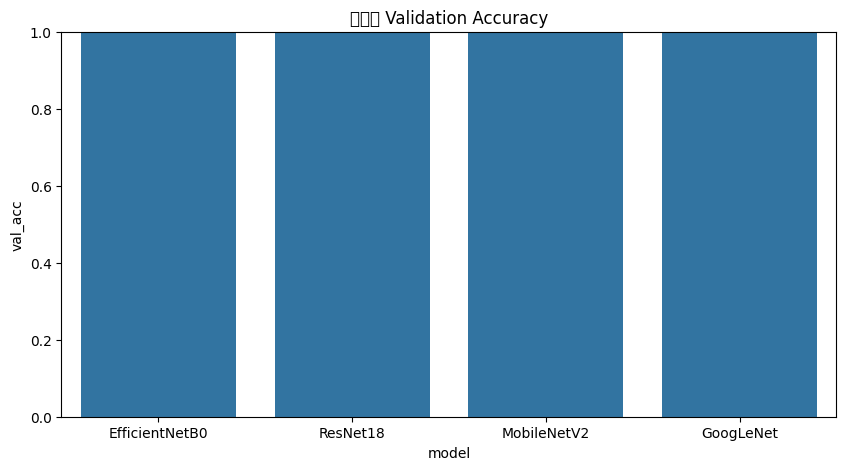

In [ ]:
## 5. 모델 정의 및 학습 실행
model_list = {
    'ResNet18': models.resnet18(pretrained=True),
    'MobileNetV2': models.mobilenet_v2(pretrained=True),
    'EfficientNetB0': models.efficientnet_b0(pretrained=True),
    'GoogLeNet': models.googlenet(pretrained=True, aux_logits=True)
}

for name, model in model_list.items():
    if 'resnet' in name.lower():
        model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
    elif 'mobilenet' in name.lower():
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, NUM_CLASSES)
    elif 'efficientnet' in name.lower():
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, NUM_CLASSES)
    elif 'googlenet' in name.lower():
        model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)

create_training_result_tables()
results = []
for name, model in model_list.items():
    result = train_model(model, name, epochs=10)
    results.append(result)
    print(results)

## 6. 결과 정리
df_results = pd.DataFrame(results)
df_results.info()
df_results = df_results.sort_values(by='val_acc', ascending=False)
print(df_results)

plt.figure(figsize=(10,5))
sns.barplot(x='model', y='val_acc', data=df_results)
plt.title('모델별 Validation Accuracy')
plt.ylim(0, 1.0)
plt.show()


In [ ]:
# label 뽑기
print(class_names)

['Bean', 'Bitter_Gourd', 'Bottle_Gourd', 'Brinjal', 'Broccoli', 'Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Cucumber', 'Papaya', 'Potato', 'Pumpkin', 'Radish', 'Tomato']


In [ ]:
import torch.nn.functional as F

# print(model)
# 모델 추론 모드
model.eval()

# 데이터 하나 뽑아서 테스트
images, labels = next(iter(val_loader))
images, labels = images.to(device), labels.to(device)

# 모델 예측
with torch.no_grad():
    outputs = model(images)
    probs = F.softmax(outputs, dim=1)

# 첫 번째 이미지에 대해 보기 좋게 출력
print("예측 확률 분포 (클래스별):")
for i, p in enumerate(probs[0]):
    print(f"{class_names[i]}: {p.item():.4f}")

print(f"\n정답 라벨: {class_names[labels[0]]}")
print(f"예측 라벨: {class_names[probs[0].argmax()]}")


예측 확률 분포 (클래스별):
Bean: 1.0000
Bitter_Gourd: 0.0000
Bottle_Gourd: 0.0000
Brinjal: 0.0000
Broccoli: 0.0000
Cabbage: 0.0000
Capsicum: 0.0000
Carrot: 0.0000
Cauliflower: 0.0000
Cucumber: 0.0000
Papaya: 0.0000
Potato: 0.0000
Pumpkin: 0.0000
Radish: 0.0000
Tomato: 0.0000

정답 라벨: Bean
예측 라벨: Bean


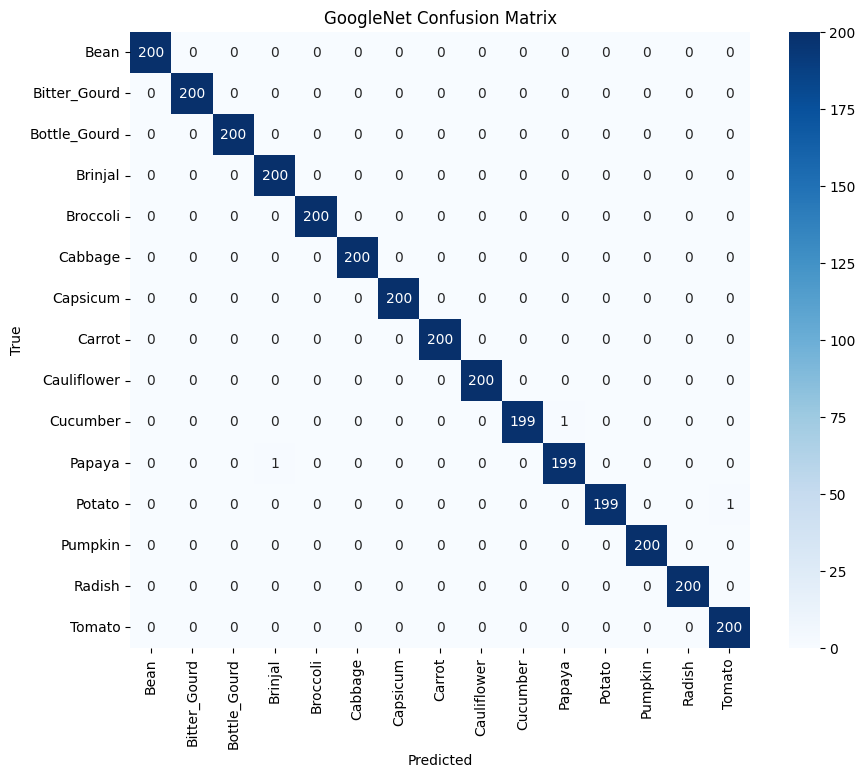

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# 전체 예측/정답 저장
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# 혼동 행렬 계산
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('GoogleNet Confusion Matrix')
plt.show()


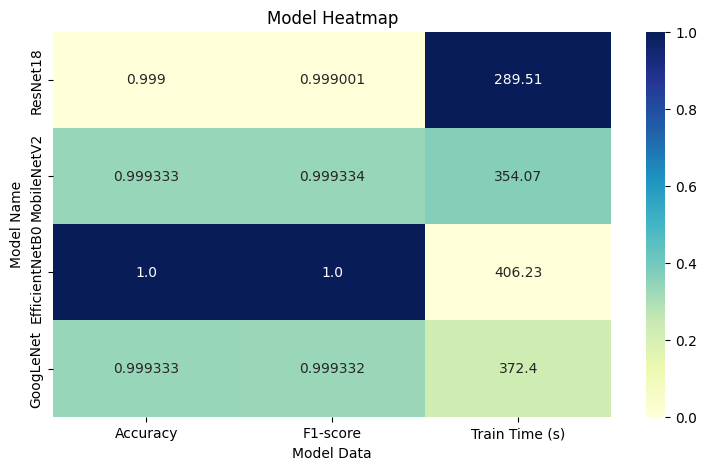

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 실제 실험 결과 데이터
data = {
    "ResNet18": {"Accuracy": 0.999000, "F1-score": 0.999001, "Train Time (s)": 289.51},
    "MobileNetV2": {"Accuracy": 0.999333, "F1-score": 0.999334, "Train Time (s)": 354.07},
    "EfficientNetB0": {"Accuracy": 1.0, "F1-score": 1.0, "Train Time (s)": 406.23},
    "GoogLeNet": {"Accuracy": 0.999333, "F1-score": 0.999332, "Train Time (s)": 372.40}
}

# DataFrame 변환
df_metrics = pd.DataFrame(data).T
df_normalized = df_metrics.copy()

# 시간은 낮을수록 좋은 지표 → 역수 정규화
df_normalized["Train Time (s)"] = 1 / df_normalized["Train Time (s)"]

# 0~1 스케일 정규화
df_normalized = (df_normalized - df_normalized.min()) / (df_normalized.max() - df_normalized.min())

# Heatmap 시각화
plt.figure(figsize=(9, 5))
sns.heatmap(df_normalized, annot=df_metrics.round(6), fmt="", cmap="YlGnBu")
plt.title("Model Heatmap")
plt.xlabel("Model Data")
plt.ylabel("Model Name")
plt.show()


### TensorBoard
- Accuracy, Loss

In [ ]:
## 7. TensorBoard 실행 (Colab 전용)
# 다음 셀 따로 실행
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
import sqlite3

def check_db(db_path):
    """
    데이터베이스에 연결하고, 테이블 목록과 각 테이블의 스키마 정보를 출력합니다.
    """
    try:
        conn = sqlite3.connect(db_path)
        print(f"SQLite DB에 성공적으로 연결되었습니다: {db_path}")
    except Exception as e:
        print(f"데이터베이스 연결 중 오류 발생: {e}")
        return None

    cursor = conn.cursor()

    # 데이터베이스 내 테이블 목록 확인
    cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
    tables = cursor.fetchall()

    if tables:
        print("데이터베이스 내 테이블 목록:")
        for table in tables:
            print(f" - {table[0]}")
    else:
        print("데이터베이스에 테이블이 존재하지 않습니다.")

    # 각 테이블의 스키마 정보 출력
    for table in tables:
        table_name = table[0]
        print(f"\n테이블 '{table_name}'의 스키마:")
        cursor.execute(f"PRAGMA table_info({table_name});")
        schema = cursor.fetchall()
        for col in schema:
            # 출력 형식: (컬럼번호, 컬럼명, 데이터 타입, NOT NULL 여부, 기본값, PK 여부)
            print(col)

    return conn

def query_table(conn, table_name):
    """
    지정된 테이블의 데이터를 조회하여 출력합니다.
    """
    cursor = conn.cursor()
    try:
        cursor.execute(f"SELECT * FROM {table_name}")
        rows = cursor.fetchall()
        if rows:
            print(f"\n테이블 '{table_name}'의 데이터:")
            for row in rows:
                print(row)
        else:
            print(f"테이블 '{table_name}'에 데이터가 없습니다.")
    except Exception as e:
        print(f"테이블 '{table_name}' 조회 중 오류 발생: {e}")

if __name__ == "__main__":
    # 실제 데이터베이스 파일 경로로 변경하세요.
    db_path = "training_logs.db"
    conn = check_db(db_path)
    if conn:
        # 사용자가 조회할 테이블 이름 입력
        table_name = input("\n조회할 테이블 이름을 입력하세요: ")
        query_table(conn, table_name)
        conn.close()


SQLite DB에 성공적으로 연결되었습니다: training_logs.db
데이터베이스 내 테이블 목록:
 - epoch_logs
 - sqlite_sequence
 - final_results

테이블 'epoch_logs'의 스키마:
(0, 'id', 'INTEGER', 0, None, 1)
(1, 'model_name', 'TEXT', 0, None, 0)
(2, 'epoch', 'INTEGER', 0, None, 0)
(3, 'train_acc', 'REAL', 0, None, 0)
(4, 'train_loss', 'REAL', 0, None, 0)
(5, 'val_acc', 'REAL', 0, None, 0)
(6, 'val_loss', 'REAL', 0, None, 0)
(7, 'test_acc', 'REAL', 0, None, 0)
(8, 'test_loss', 'REAL', 0, None, 0)
(9, 'timestamp', 'TEXT', 0, None, 0)

테이블 'sqlite_sequence'의 스키마:
(0, 'name', '', 0, None, 0)
(1, 'seq', '', 0, None, 0)

테이블 'final_results'의 스키마:
(0, 'id', 'INTEGER', 0, None, 1)
(1, 'model_name', 'TEXT', 0, None, 0)
(2, 'best_epoch', 'INTEGER', 0, None, 0)
(3, 'train_acc', 'REAL', 0, None, 0)
(4, 'train_loss', 'REAL', 0, None, 0)
(5, 'val_acc', 'REAL', 0, None, 0)
(6, 'val_loss', 'REAL', 0, None, 0)
(7, 'test_acc', 'REAL', 0, None, 0)
(8, 'test_loss', 'REAL', 0, None, 0)
(9, 'timestamp', 'TEXT', 0, None, 0)

조회할 테이블 이름을 입력하세요: sqli

# DB 연결
- SQLLite DB 연결

In [ ]:
from datetime import datetime

def log_epoch(model_name, epoch, loss, accuracy, f1_score):
    start_time = datetime.now()
    end_time = datetime.now()

    conn = sqlite3.connect("training_logs.db")
    cursor = conn.cursor()

    cursor.execute("""
    INSERT INTO training_logs (model_name, epoch, start_time, end_time, loss, accuracy, f1_score)
    VALUES (?, ?, ?, ?, ?, ?, ?)
    """, (
        model_name,
        epoch,
        start_time.isoformat(),
        end_time.isoformat(),
        loss,
        accuracy,
        f1_score
    ))

    conn.commit()
    conn.close()
    print(f"✅ Epoch {epoch} 로그 저장 완료")


In [ ]:
# 테스트 로그 저장 (여러 번 실행해봐도 돼)
log_epoch("ResNet18", epoch=1, loss=0.1234, accuracy=0.9876, f1_score=0.9821)
log_epoch("ResNet18", epoch=2, loss=0.0987, accuracy=0.9901, f1_score=0.9844)


✅ Epoch 1 로그 저장 완료
✅ Epoch 2 로그 저장 완료


In [ ]:
# SELECT 조회해보기
import pandas as pd

def read_logs(model_name=None):
  conn = sqlite3.connect("training_logs.db")
  if model_name:
    query = f'SELECT * FROM training_logs WHERE model_name = ?'
    df = pd.read_sql(query, conn, params=(model_name, ))
  else:
    df = pd.read_sql("SELECT * FROM training_logs", conn)
  conn.close()
  return df
# 전체 로그 조회
df_logs = read_logs()
df_logs

,id,model_name,epoch,start_time,end_time,loss,accuracy,f1_score
0,1,ResNet18,1,2025-03-25T05:30:31.974598,2025-03-25T05:30:31.974600,0.1234,0.9876,0.9821
1,2,ResNet18,2,2025-03-25T05:30:31.984205,2025-03-25T05:30:31.984207,0.0987,0.9901,0.9844


---

#### 딥 CNN

In [ ]:
transform = T.Compose([
    T.Resize((128, 128)),
    T.RandomHorizontalFlip(),
    T.RandomRotation(15),
    T.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
train_dataset = datasets.ImageFolder('/content/vegetable_images/Vegetable Images/train', transform=transform)
val_dataset = datasets.ImageFolder('/content/vegetable_images/Vegetable Images/validation', transform=transform)
test_dataset = datasets.ImageFolder('/content/vegetable_images/Vegetable Images/test', transform=transform)

# Create a DataLoader for the training dataset
batchSize = 32
train_loader = DataLoader(train_dataset, batch_size=batchSize, shuffle=True, drop_last=True)
val_loader = DataLoader(val_dataset, batch_size=batchSize, shuffle=False, drop_last=True)
test_loader = DataLoader(test_dataset, batch_size=batchSize, shuffle=False, drop_last=True)

In [ ]:
print(f"Number of training samples: {len(train_loader.dataset.samples)}")
print(f"Number of validation samples: {len(val_loader.dataset.samples)}")
print(f"Number of testing samples: {len(test_loader.dataset.samples)}")

Number of training samples: 15000
Number of validation samples: 3000
Number of testing samples: 3000


In [ ]:
img_size = [128, 128]
kernel_size = 3
stride = 1
padding = 1
window_size = 2  # for pooling
learning_rate = 0.001
l2_lambda = 1e-3

def makeTheNet():
    class vegetableNet(nn.Module):
        def __init__(self):
            super().__init__()

            # conv layer 1 + adding batch normalization
            self.conv1 = nn.Conv2d(3, 64, kernel_size, stride, padding)
            self.bnorm1 = nn.BatchNorm2d(64)
            conv1_imgSize = np.floor((img_size[0] + 2*padding - kernel_size) / stride) + 1
            post_pooling_conv1 = np.floor(conv1_imgSize / window_size).astype(int)

            # conv layer 2 + adding batch normalization
            self.conv2 = nn.Conv2d(64, 128, kernel_size, stride, padding)
            self.bnorm2 = nn.BatchNorm2d(128)
            conv2_imgSize = np.floor((post_pooling_conv1 + 2*padding - kernel_size) / stride) + 1
            post_pooling_conv2 = np.floor(conv2_imgSize / window_size).astype(int)

            # conv layer 3 + adding batch normalization
            self.conv3 = nn.Conv2d(128, 256, kernel_size, stride, padding)
            self.bnorm3 = nn.BatchNorm2d(256)
            conv3_imgSize = np.floor((post_pooling_conv2 + 2*padding - kernel_size) / stride) + 1
            post_pooling_conv3 = np.floor(conv3_imgSize / window_size).astype(int)

            # conv layer 4 + adding batch normalization
            self.conv4 = nn.Conv2d(256, 512, kernel_size, stride, padding)
            self.bnorm4 = nn.BatchNorm2d(512)
            conv4_imgSize = np.floor((post_pooling_conv3 + 2*padding - kernel_size) / stride) + 1
            post_pooling_conv4 = np.floor(conv4_imgSize / window_size).astype(int)

            # conv layer 5 + adding batch normalization
            self.conv5 = nn.Conv2d(512, 512, kernel_size, stride, padding)
            self.bnorm5 = nn.BatchNorm2d(512)
            conv5_imgSize = np.floor((post_pooling_conv4 + 2*padding - kernel_size) / stride) + 1
            post_pooling_conv5 = np.floor(conv5_imgSize / window_size).astype(int)

            # conv layer 6 + adding batch normalization
            self.conv6 = nn.Conv2d(512, 512, kernel_size, stride=2, padding=1)  # Increased stride
            self.bnorm6 = nn.BatchNorm2d(512)
            conv6_imgSize = np.floor((post_pooling_conv5 + 2*1 - kernel_size) / 2) + 1
            post_pooling_conv6 = np.floor(conv6_imgSize / window_size).astype(int)


            # Fully-connected layers
            self.fc1 = nn.Linear(post_pooling_conv6 * post_pooling_conv6 * 512, 1024)
            self.output = nn.Linear(1024, 15)

        def forward(self, x):

            # relu -> bnorm -> max_pool -> conv
            x = F.relu(self.bnorm1(F.max_pool2d(self.conv1(x), window_size)))
            #print('first conv1 layer', x.shape)
            x = F.relu(self.bnorm2(F.max_pool2d(self.conv2(x), window_size)))
            #print('first conv2 layer', x.shape)
            x = F.relu(self.bnorm3(F.max_pool2d(self.conv3(x), window_size)))
            #print('first conv3 layer', x.shape)
            x = F.relu(self.bnorm4(F.max_pool2d(self.conv4(x), window_size)))
            #print('first conv4 layer', x.shape)
            x = F.relu(self.bnorm5(F.max_pool2d(self.conv5(x), window_size)))
            #print('first conv5 layer', x.shape)
            x = F.relu(self.bnorm6(F.max_pool2d(self.conv6(x), window_size)))
            #print('first conv6 layer', x.shape)

            # Reshaping for linear layer
            x = x.reshape(x.shape[0], -1)

            # Passing linear layer through relu
            x = F.relu(self.fc1(x))


            return self.output(x)

    vegetablenet = vegetableNet()

    lossfun = nn.CrossEntropyLoss()

    optimizer = torch.optim.Adam(vegetablenet.parameters(), lr=learning_rate, weight_decay=l2_lambda)

    return vegetablenet, lossfun, optimizer

In [ ]:
vegetablenet,lossfun,optimizer = makeTheNet()

X,y = next(iter(train_loader))
yHat = vegetablenet(X)

print('\nOutput size:')
print(yHat.shape)

# now let's compute the loss, uninterpretable loss ofcourse
loss = lossfun(yHat,torch.squeeze(y))
print(' ')
print('Loss:')
print(loss)


Output size:
torch.Size([32, 15])
 
Loss:
tensor(2.6726, grad_fn=<NllLossBackward0>)


#### CNN 구조
6개의 layer와 FC layer 총 7개의 레이어를 사용했습니다.

In [ ]:
summary(vegetablenet, (3, 128, 128) ,device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           1,792
       BatchNorm2d-2           [-1, 64, 64, 64]             128
            Conv2d-3          [-1, 128, 64, 64]          73,856
       BatchNorm2d-4          [-1, 128, 32, 32]             256
            Conv2d-5          [-1, 256, 32, 32]         295,168
       BatchNorm2d-6          [-1, 256, 16, 16]             512
            Conv2d-7          [-1, 512, 16, 16]       1,180,160
       BatchNorm2d-8            [-1, 512, 8, 8]           1,024
            Conv2d-9            [-1, 512, 8, 8]       2,359,808
      BatchNorm2d-10            [-1, 512, 4, 4]           1,024
           Conv2d-11            [-1, 512, 2, 2]       2,359,808
      BatchNorm2d-12            [-1, 512, 1, 1]           1,024
           Linear-13                 [-1, 1024]         525,312
           Linear-14                   

In [ ]:
def function2traintestTheModel():
    numepochs = 25
    vegetablenet, lossfun, optimizer = makeTheNet()

    # Send model to the GPU
    vegetablenet.to(device)
    # Initialize losses / accuracies
    trainLoss = torch.zeros(numepochs)
    valLoss = torch.zeros(numepochs)
    testLoss = torch.zeros(numepochs)
    trainAcc = torch.zeros(numepochs)
    valAcc = torch.zeros(numepochs)
    testAcc = torch.zeros(numepochs)

    start_time = time.time()
    for epochi in range(numepochs):
        epoch_start_time = time.time()
        # train mode
        vegetablenet.train()

        # training
        batch_train_loss = []
        batch_train_acc = []
        for X, y in train_loader:
            # Send the data to the GPU
            X, y = X.to(device), y.to(device)

            yHat = vegetablenet(X)
            loss = lossfun(yHat, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            # Appending losses, computing accuracy
            batch_train_loss.append(loss.item())
            batch_train_acc.append(torch.mean((torch.argmax(yHat, axis=1) == y).float()).item())
        # Storing results
        trainLoss[epochi] = np.mean(batch_train_loss)
        trainAcc[epochi] = 100 * np.mean(batch_train_acc)
        # eval mode
        vegetablenet.eval()

        with torch.no_grad():
            # Validation
            batch_val_loss = []
            batch_val_acc = []
            for X, y in val_loader:
                X, y = X.to(device), y.to(device)

                yHat = vegetablenet(X)
                loss = lossfun(yHat, y)

                batch_val_loss.append(loss.item())
                batch_val_acc.append(torch.mean((torch.argmax(yHat, axis=1) == y).float()).item())

            valLoss[epochi] = np.mean(batch_val_loss)
            valAcc[epochi] = 100 * np.mean(batch_val_acc)
            # Test
            batch_test_loss = []
            batch_test_acc = []
            for X, y in test_loader:
                X, y = X.to(device), y.to(device)

                yHat = vegetablenet(X)
                loss = lossfun(yHat, y)

                batch_test_loss.append(loss.item())
                batch_test_acc.append(torch.mean((torch.argmax(yHat, axis=1) == y).float()).item())

            testLoss[epochi] = np.mean(batch_test_loss)
            testAcc[epochi] = 100 * np.mean(batch_test_acc)

        epoch_time = time.time() - epoch_start_time
        total_time = time.time() - start_time

        # Print progress
        sys.stdout.write(f"\rFinished epoch: {epochi+1}/{numepochs}, time: {epoch_time:.2f}s, total time: {total_time:.2f}s")

    print("\nTraining completed!")
    return trainLoss, valLoss, testLoss, trainAcc, valAcc, testAcc, vegetablenet

In [ ]:
trainLoss, valLoss, testLoss, trainAcc, valAcc, testAcc, vegetablenet = function2traintestTheModel()

Finished epoch: 25/25, time: 84.96s, total time: 2104.68s
Training completed!


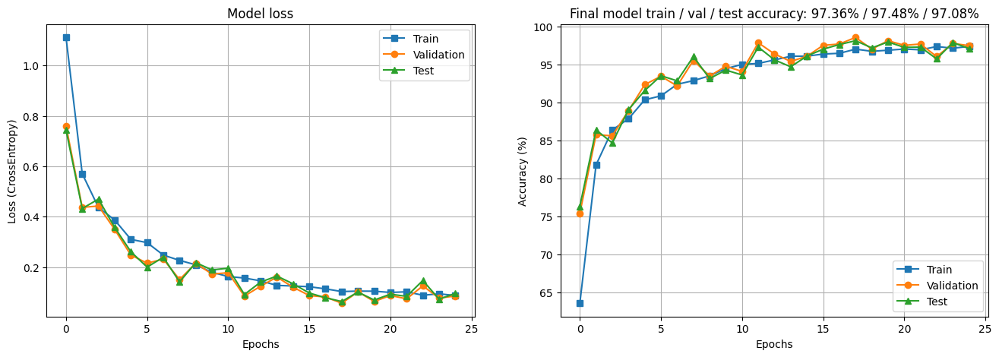

In [ ]:
# Plot the results
fig, ax = plt.subplots(1, 2, figsize=(16, 5))

ax[0].plot(trainLoss, 's-', label='Train')
ax[0].plot(valLoss, 'o-', label='Validation')
ax[0].plot(testLoss, '^-', label='Test')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss (CrossEntropy)')
ax[0].set_title('Model loss')
ax[0].legend()
ax[0].grid(True)

ax[1].plot(trainAcc, 's-', label='Train')
ax[1].plot(valAcc, 'o-', label='Validation')
ax[1].plot(testAcc, '^-', label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy (%)')
ax[1].set_title(f'Final model train / val / test accuracy: {trainAcc[-1]:.2f}% / {valAcc[-1]:.2f}% / {testAcc[-1]:.2f}%')
ax[1].legend()
ax[1].grid(True)

plt.show()

In [ ]:
torch.save(vegetablenet.state_dict(), '/content/vegetable_classification_model.pth')